# YSC2239 Final Project: AirBNB Affordability in New York City
### Laura SUTANTO, Joshua VARGAS, ZHU Wentao

## Introduction

This project is based on a dataset of AirBNB listings in New York City. We are interested in looking at the potential predictors of an AirBNB listing's price. If the model has predictive power, the real-world applications of such a model are diverse. Such a model could help prospective travelers to New York City decide on locations to stay. It could also potentially help a search engine narrow the data it has to sift through to respond to an end-user's price expectations. What we find from the data could also be of use to social scientists who may be trying to study the New York short-term property market.

In this file, we will be examining the data, refining our research question, and then use feature engineering using scikit-learn to figure out which features can create the best model for price.

## Prerequisites

This project requires the following packages not included by default in Anaconda:
* geopandas
* geoplot

Ensure that these are installed before running this project as-is. *Note that these packages are only required for geospatial visualisations (i.e. maps).* If you are not interested in this section, feel free to comment out lines of code that use these packages. *They will not affect the actual model.*

The following block of code will install geopandas and geoplot, using both conda and pip.

In [1]:
# Using conda, which only works 
# conda install --channel conda-forge geopandas
# conda install geoplot -c conda-forge

# Using pip
# pip install geopandas
# pip install geoplot
# Note that geopandas requires the folllowing packages as dependencies: fiona, pyproj, rtree, shapely. The installation for each of these will depend on your operating system.

The following block of code will import the libraries necessary for running this file.

In [1]:
# numpy and pandas for accessing and manipulating data
import numpy as np
import pandas as pd

# matplotlib, seaborn, and plotly for visualising tabular data and our model
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
plt.style.use('fivethirtyeight')
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff

# geopandas, geoplot, and shapely for geospatial visualisation
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
from shapely.geometry import Point

# scikit-learn
from sklearn import cluster

# 
import zipfile
from pathlib import Path
import os # Used to interact with the file system

## Exploratory Data Analysis

Our dataset is the popular "New York City Airbnb Open Data" dataset on Kaggle. This dataset shows AirBNB listings in New York City during 2019, including information of the listing's name; host's name, location in terms of neighbourhood group, neighbourhood, and coordinates; room type; price; minimum nights; review information; and availability information.

Let's first load up that dataset:

In [2]:
data = pd.read_csv("AB_NYC_2019.csv")
data

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


Let's look at the unique values of the categorical variables.

In [4]:
print('Unique values of neighbourhood_group: ', data.neighbourhood_group.unique())
print('Unique values of neighbourhood: ', data.neighbourhood.unique())
print('Unique values of room_type: ', data.room_type.unique())

Unique values of neighbourhood_group:  ['Brooklyn' 'Manhattan' 'Queens' 'Staten Island' 'Bronx']
Unique values of neighbourhood:  ['Kensington' 'Midtown' 'Harlem' 'Clinton Hill' 'East Harlem'
 'Murray Hill' 'Bedford-Stuyvesant' "Hell's Kitchen" 'Upper West Side'
 'Chinatown' 'South Slope' 'West Village' 'Williamsburg' 'Fort Greene'
 'Chelsea' 'Crown Heights' 'Park Slope' 'Windsor Terrace' 'Inwood'
 'East Village' 'Greenpoint' 'Bushwick' 'Flatbush' 'Lower East Side'
 'Prospect-Lefferts Gardens' 'Long Island City' 'Kips Bay' 'SoHo'
 'Upper East Side' 'Prospect Heights' 'Washington Heights' 'Woodside'
 'Brooklyn Heights' 'Carroll Gardens' 'Gowanus' 'Flatlands' 'Cobble Hill'
 'Flushing' 'Boerum Hill' 'Sunnyside' 'DUMBO' 'St. George' 'Highbridge'
 'Financial District' 'Ridgewood' 'Morningside Heights' 'Jamaica'
 'Middle Village' 'NoHo' 'Ditmars Steinway' 'Flatiron District'
 'Roosevelt Island' 'Greenwich Village' 'Little Italy' 'East Flatbush'
 'Tompkinsville' 'Astoria' 'Clason Point' 'East

We need to better understand our data before we are able to create a model out of it. Here is our understanding of each of the variables in this dataset:

* `id` is the unique identifier of each listing.
* `name` pertains to the name given to the listing, which AirBNB users see when they search for listings.
* `host_id` is the unique identifier of each host. It is necessary because different hosts may have the same name, and hence `host_name` values.
* `neighbourhood_group` refers to the five *boroughs* of New York, which are groups of neighbourhoods.
* `neighbourhood` refers to the specific neighbourhood where the listing is located.
* `latitude` and `longitude` refer to the geospatial coordinates of the listing's location.
* `room_type` shows the category of the room according to AirBNB's classification.
* `price` refers to the price of the room per night in US dollars (USD).
* `minimum_nights` refers to the minimum stay duration.
* `number_of_reviews` refers to the number of reviews left by AirBNB users.
* `last_review` refers to the date of the latest review.
* `reviews_per_month` shows the frequency reviews are left on the listing. A higher value indicates that people frequently review this location.
* `calculated_host_listings_count` was unclear to us, but we guess it refers to how many listings the host has. Perhaps 'calculated' means this value was calculated from the existing data (i.e. from the dataset's host IDs) and not taken from AirBNB.
* `availability_365` refers to the property's availability on AirBNB in terms of days within a year.

We are interested in predicting **price** from the other variables. We should first look at the descriptive statistics for the variable of `price`.

In [5]:
data['price'].describe()

count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
25%         69.000000
50%        106.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

Note how the 75th percentile is 175, yet the maximum value is 10000. The Kaggle page for this dataset notes that the maximum price value is 10000, which means that 10000 values are actual data, and not missing or incorrectly-typed data. Let's look at the distribution of `price` using a histogram.

array([[<AxesSubplot:title={'center':'price'}>]], dtype=object)

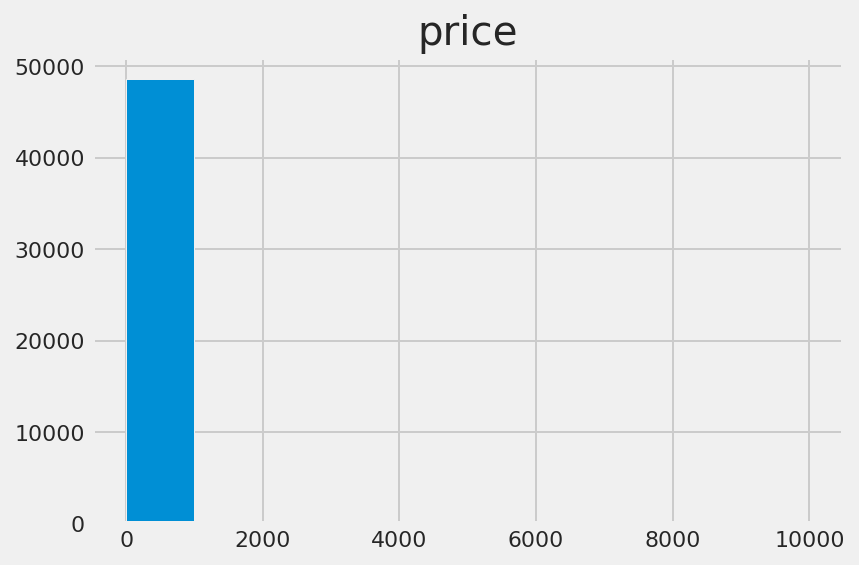

In [6]:
data.hist('price')

In [7]:
len(data[data["price"]<250])/len(data)*100

87.26659167604049

This odd histogram suggests the presence of extreme outliers. Based on the descriptive statistics we calculated earlier, we looked at which values are more than two standard deviations above the mean, which in the social sciences is the rough threshold for what constitutes an outlier:

In [8]:
two_sds = np.mean(data['price']) + (2 * np.std(data['price']))
print('two standard deviations above the mean: ', two_sds)
data[data['price'] > two_sds]

two standard deviations above the mean:  633.0241150256627


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
85,19601,perfect for a family or small group,74303,Maggie,Brooklyn,Brooklyn Heights,40.69723,-73.99268,Entire home/apt,800,1,25,2016-08-04,0.24,1,7
345,89427,The Brooklyn Waverly,116599,Sahr,Brooklyn,Clinton Hill,40.68613,-73.96536,Entire home/apt,650,5,0,NaN,NaN,3,365
496,174966,Luxury 2Bed/2.5Bath Central Park View,836168,Henry,Manhattan,Upper West Side,40.77350,-73.98697,Entire home/apt,2000,30,30,2018-05-05,0.33,11,0
653,248871,4 BEDROOM -2BATHRM WEST VILLAGE DUPLEX TOWNHOUSE,605463,West Village,Manhattan,West Village,40.73066,-74.00287,Entire home/apt,700,3,131,2019-06-24,1.40,4,296
662,250801,Heart & Soul of Greenwich Village,1314834,Rhona,Manhattan,Greenwich Village,40.73129,-73.99944,Entire home/apt,850,3,107,2019-05-23,1.15,1,249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48523,36308562,"Tasteful & Trendy Brooklyn Brownstone, near Train",217732163,Sandy,Brooklyn,Bedford-Stuyvesant,40.68767,-73.95805,Entire home/apt,1369,1,0,NaN,NaN,1,349
48535,36311055,"Stunning & Stylish Brooklyn Luxury, near Train",245712163,Urvashi,Brooklyn,Bedford-Stuyvesant,40.68245,-73.93417,Entire home/apt,1749,1,0,NaN,NaN,1,303
48697,36388720,HUGE LUXURY CONDO – INCREDIBLE WATER VIEWS,273619215,Layla,Manhattan,Upper West Side,40.77665,-73.98867,Entire home/apt,750,4,0,NaN,NaN,1,174
48757,36419574,Luxury & Spacious 1500 ft² MANHATTAN Townhouse,11454384,Ellen,Manhattan,Tribeca,40.71815,-74.01145,Entire home/apt,700,3,0,NaN,NaN,1,37


We can see that some of the values are far above the threshold of two standard deviations above the mean.

Let's look at the distribution of price below this threshold:

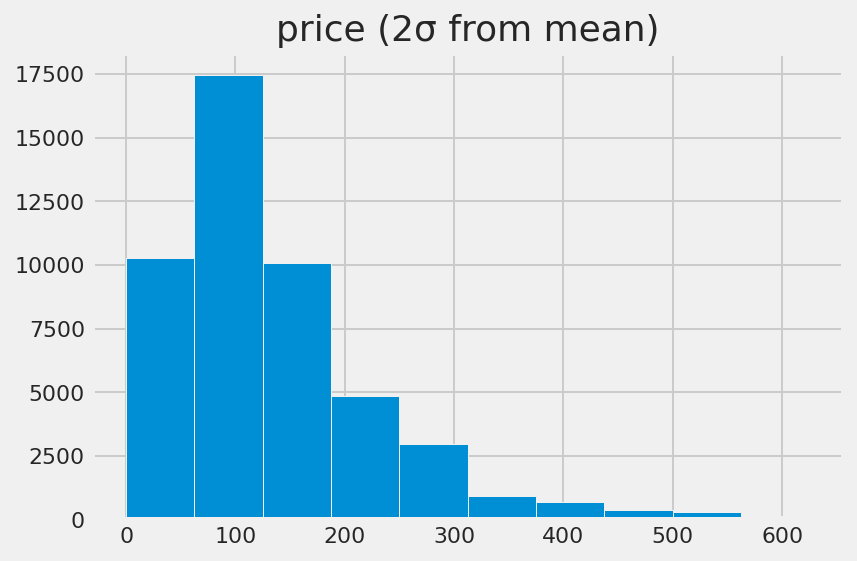

In [9]:
data[data['price'] < two_sds].hist('price')
plt.title("price (2σ from mean)", fontsize=18);

This is a unimodal distribution with a large skew to the right.

Because there are 767 outliers, which is a small number compared to the total number of listings (48895), we can make a subset with the values within 2 standard deviations away from the mean.

In [10]:
data_2sds = data[data['price'] < np.mean(data['price']) + (2 * np.std(data['price']))]
data_2sds

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


We can also make a subset of points that are 1 standard deviation above the mean. As the standard deviation is larger than the mean, we only need to limit the upper values of the dataset in these subsetting definitions. Therefore, these values are all lower than 392.87.

In [3]:
data_1sd = data[data['price'] < np.mean(data['price']) + (np.std(data['price']))]
data_1sd

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


Here is a histogram of this subset:

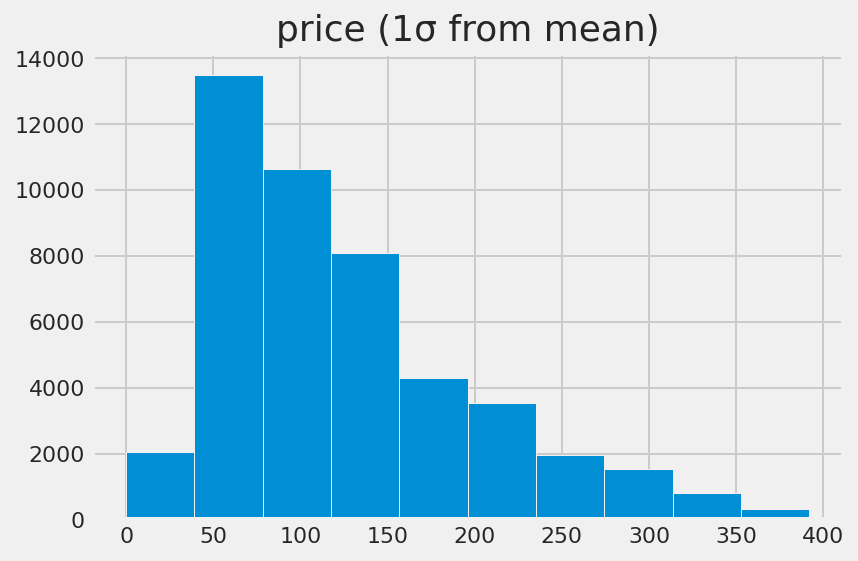

In [12]:
data_1sd.hist('price')
plt.title("price (1σ from mean)", fontsize=18);

We can look at the correlations between the numerical columns in the dataset using a correlation matrix, which we generated by:
* Using `pandas.DataFrame.corr` to compare pairwise correlations of columns;
* Using a Seaborn heatmap to visualise the resulting matrix.

<AxesSubplot:>

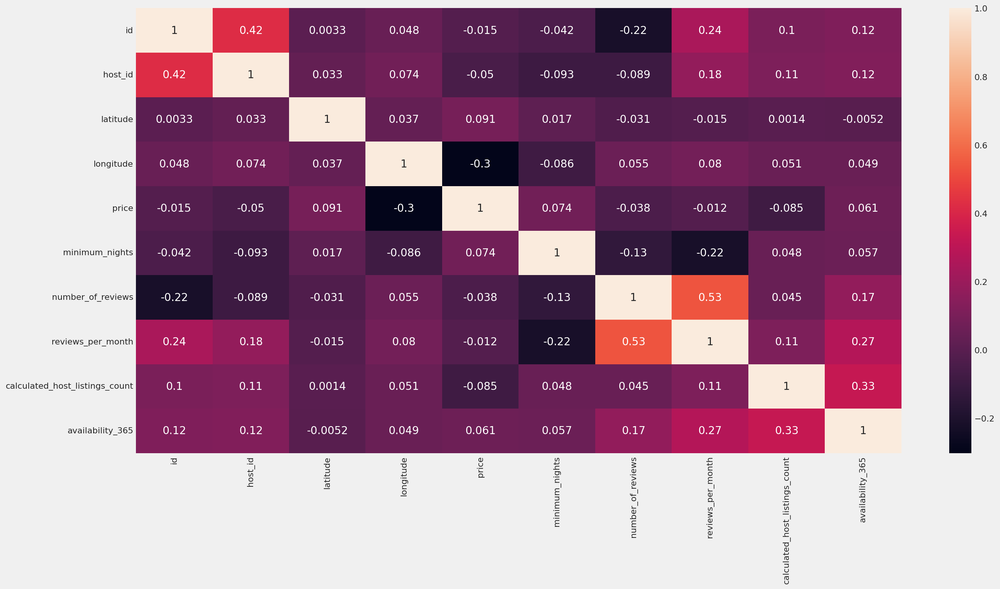

In [13]:
plt.figure(figsize=(20,10))
sns.heatmap(data.corr(method='kendall'), annot=True)

We can see that, between the numerical values, there is no strong predictor for price. **Any bi-variate linear regression model will fail to acceptably fit the data.** This motivates the use of non-linear regressions and machine learning techniques for modelling. Therefore, when we do our predictions, we will explore the use of other variables, such as one-hot encoding on our string variables, and cross-validation to see if a combination of predictors may create a stronger model.

To understand the geographic context of our data, let's plot the `latitude` and `longitude` values of our dataset and generate some maps. For this purpose, we are going to utilise some new geospatial data libraries:
* geopandas: an extension to pandas equipped to access and manipulate geospatial data
* geoplot: a geospatial plotting library which extends matplotlib to handle geospatial data

We will first prepare our data as well as the basemap, or the underlying image file upon which we will plot our points, for plotting:

In [14]:
# Converting our dataset into a GeoDataFrame using geopandas for plotting using the geoplot library
data_geopandas_points = data.apply(
    lambda srs: Point(float(srs['longitude']), float(srs['latitude'])),
    axis='columns'
)
data_geopandas = gpd.GeoDataFrame(data, geometry=data_geopandas_points)

boroughs = gpd.read_file(gplt.datasets.get_path('nyc_boroughs'))

Let's try to get a sense of where each point is in New York. The common way of dividing New York City is through 'boroughs,' which are akin to districts in Singapore. They are represented in our dataset as `neighbourhood_group`. Let's plot the points and colour-code them according to which borough they are in.

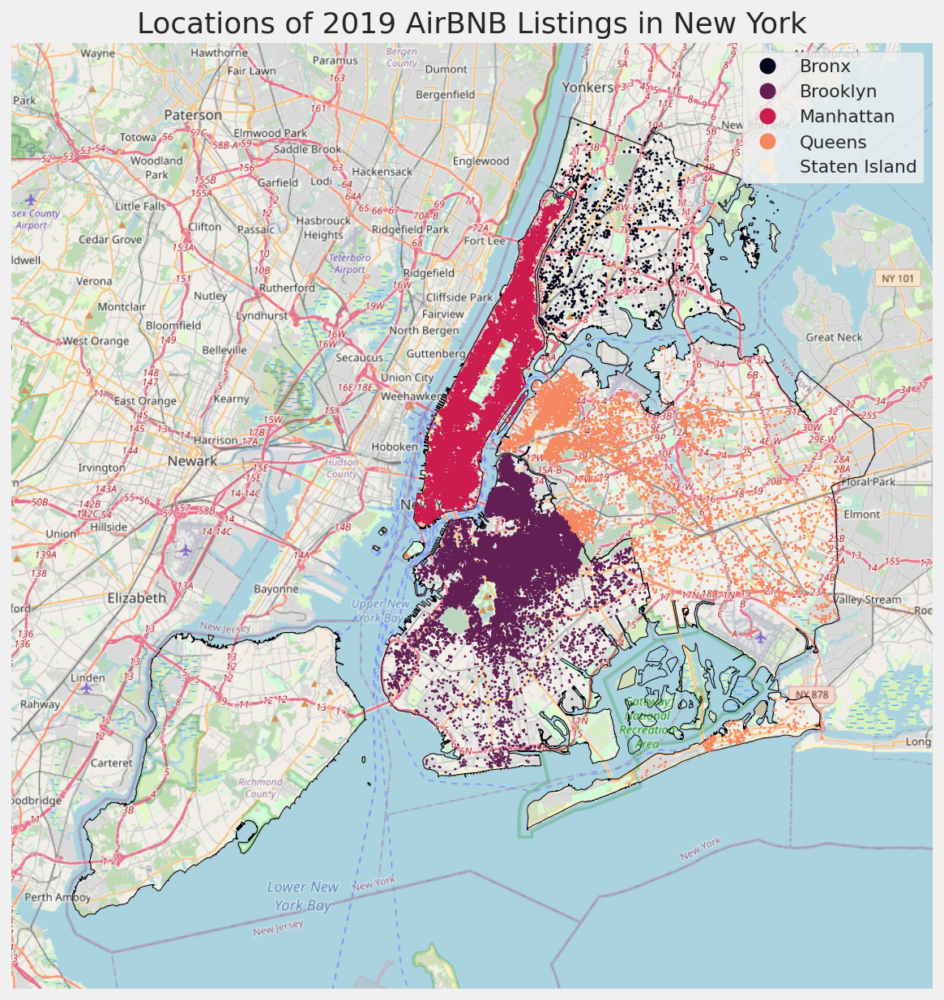

In [15]:
ax = gplt.webmap(boroughs, projection=gcrs.WebMercator(), figsize=(10,10))
gplt.polyplot(boroughs, projection=gcrs.AlbersEqualArea(), ax=ax)
gplt.pointplot(
    data_geopandas,
    hue='neighbourhood_group',
    legend=True, legend_var='hue',
    s=1,
    ax = ax
)
plt.title("Locations of 2019 AirBNB Listings in New York", fontsize=18);

New York City's boroughs have distinct histories and reputations. We are expecting properties in Manhattan to dominate the upper tier of listings in terms of price due to the astronomical land values in this borough. Let's try to colour the plot according to price to see if, visually, we can detect some kind of pattern:

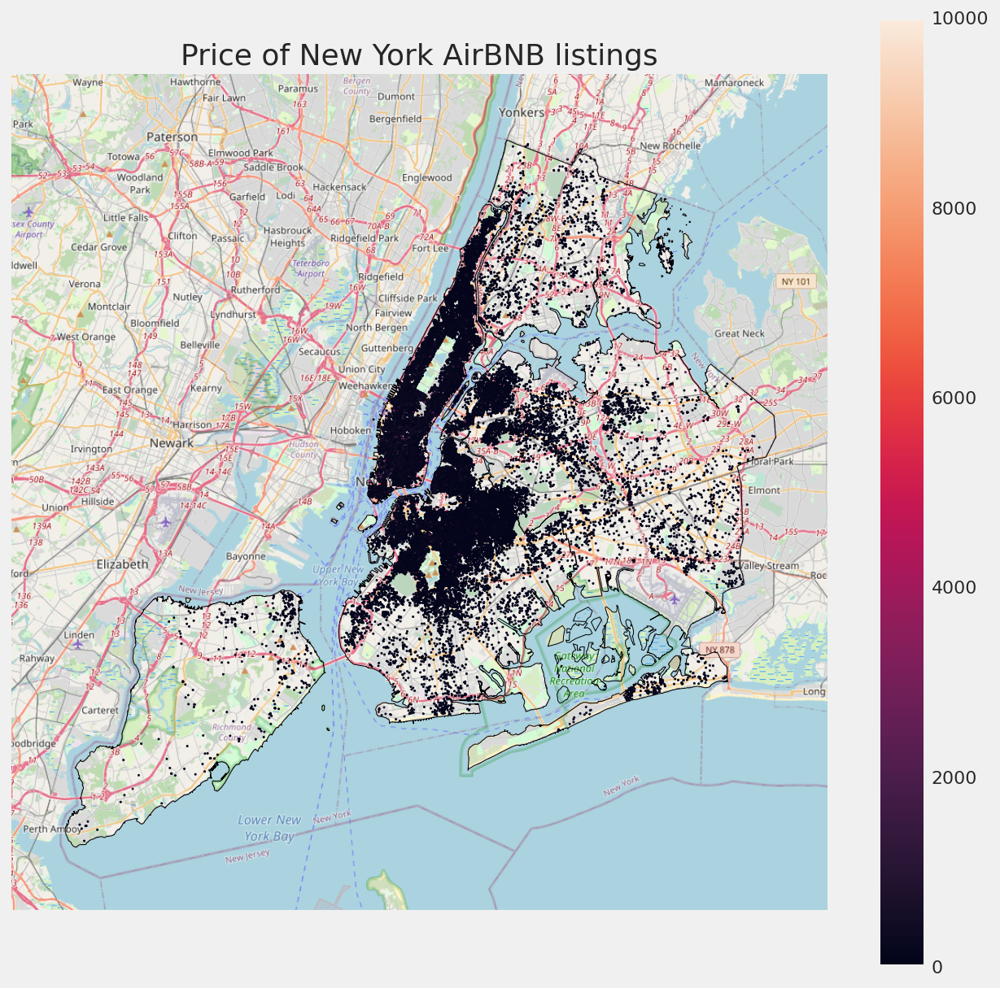

In [16]:
ax = gplt.webmap(boroughs, projection=gcrs.WebMercator(), figsize=(10,10))
gplt.polyplot(boroughs, projection=gcrs.AlbersEqualArea(), ax=ax)
gplt.pointplot(
    data_geopandas,
    hue='price',
    legend=True, legend_var='hue',
    s=1,
    ax = ax
)
plt.title("Price of New York AirBNB listings", fontsize=18);

Because of our extreme outliers, this plot does not tell us much. Let's try using `data_2sds` instead:

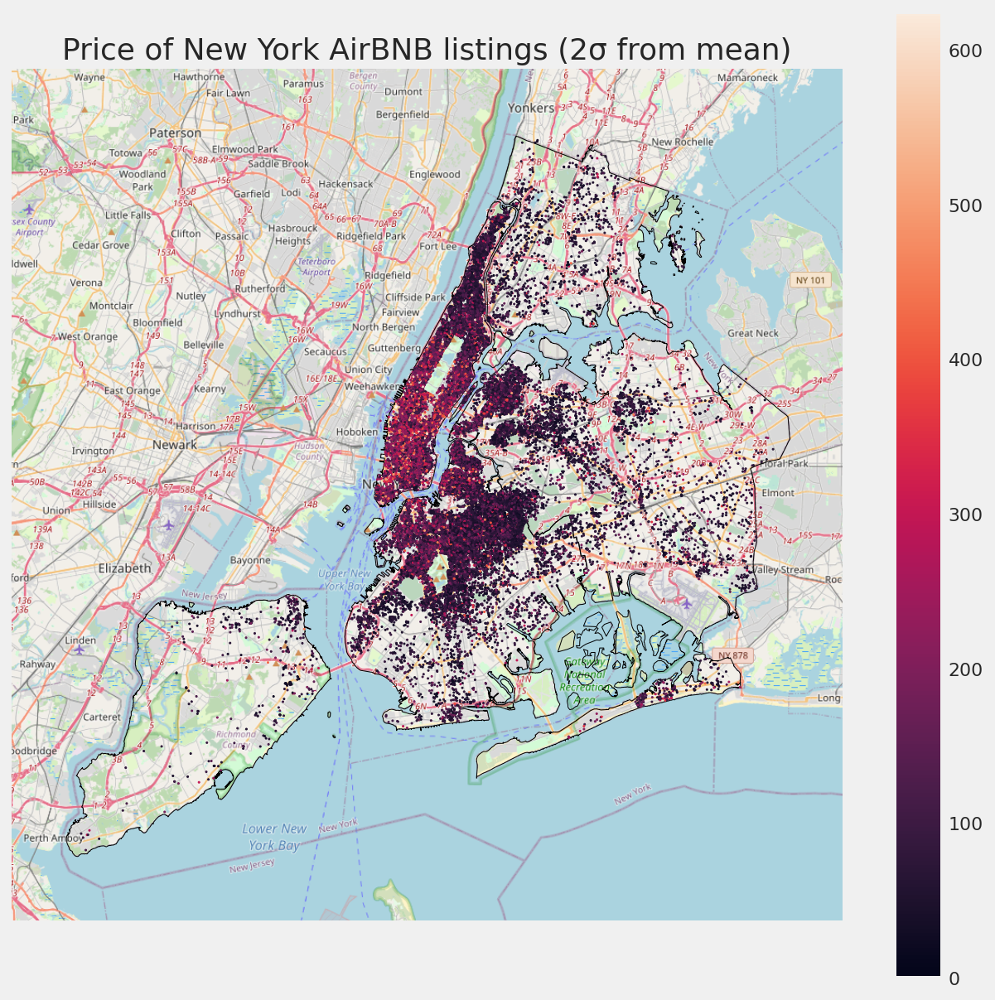

In [17]:
# Creating a geopandas dataset for data_2sds
data_2sds_geopandas_points = data_2sds.apply(
    lambda srs: Point(float(srs['longitude']), float(srs['latitude'])),
    axis='columns'
)
data_2sds_geopandas = gpd.GeoDataFrame(data_2sds, geometry=data_2sds_geopandas_points)

ax = gplt.webmap(boroughs, projection=gcrs.WebMercator(), figsize=(10,10))
gplt.polyplot(boroughs, projection=gcrs.AlbersEqualArea(), ax=ax)
gplt.pointplot(
    data_2sds_geopandas,
    hue='price',
    legend=True, legend_var='hue',
    s=1,
    ax = ax
)
plt.title("Price of New York AirBNB listings (2σ from mean)", fontsize=18);

Some areas do appear to have concentrations of high prices, and the Manhattan area definitely has a concentration of high-price listings. But this is just visual diagnostics. Let's look at the descriptive statistics for each of the boroughs.

In [18]:
EDA_neighbourhood_groups = data.iloc[:, [4, 9]].groupby(by='neighbourhood_group').describe()
EDA_neighbourhood_groups

price                                             \
                       count        mean         std   min   25%    50%   
neighbourhood_group                                                       
Bronx                 1091.0   87.496792  106.709349   0.0  45.0   65.0   
Brooklyn             20104.0  124.383207  186.873538   0.0  60.0   90.0   
Manhattan            21661.0  196.875814  291.383183   0.0  95.0  150.0   
Queens                5666.0   99.517649  167.102155  10.0  50.0   75.0   
Staten Island          373.0  114.812332  277.620403  13.0  50.0   75.0   

                                     
                       75%      max  
neighbourhood_group                  
Bronx                 99.0   2500.0  
Brooklyn             150.0  10000.0  
Manhattan            220.0  10000.0  
Queens               110.0  10000.0  
Staten Island        110.0   5000.0

There is another non-numerical variable that impacts price, even *within* a borough. The *type of a room* will impact room prices. Given the nature of these differing room types, it makes sense if 'Entire home/apt' listings cost more than 'Shared room' listings, even if all else (like neighbourhood) are equal. We can see if the distribution of different room types is even or not across New York:

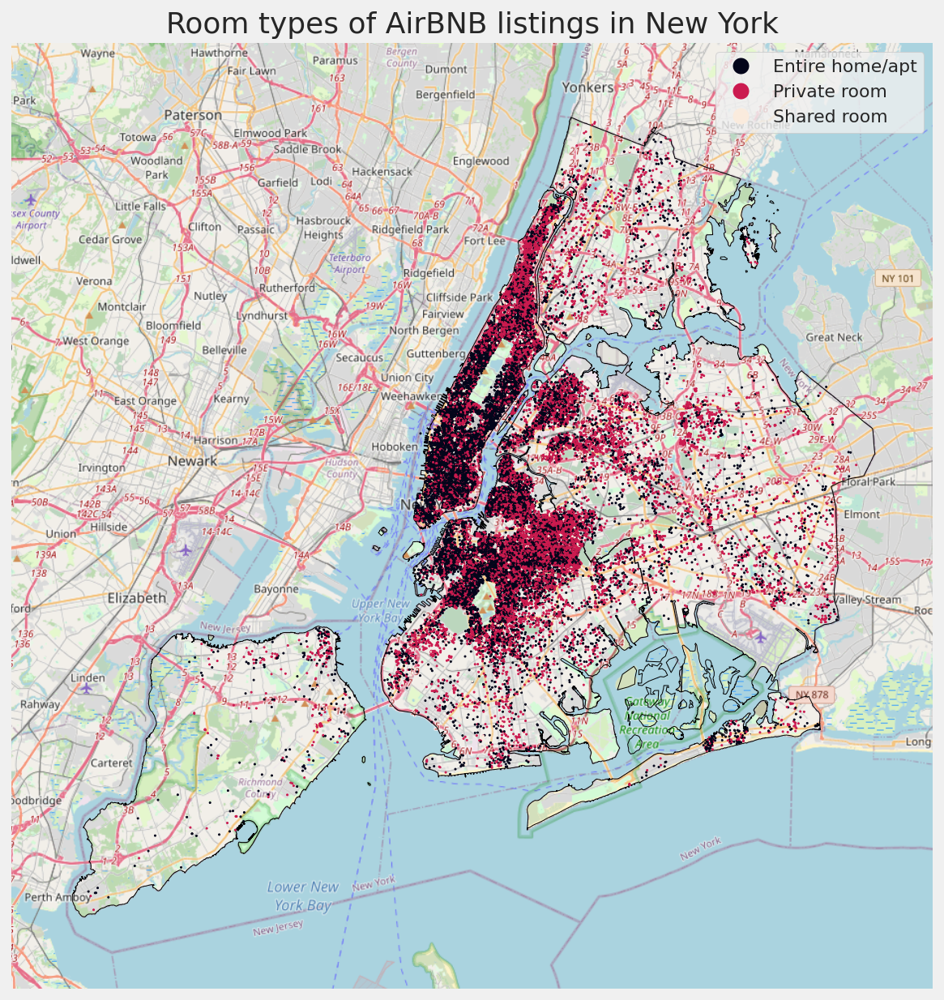

In [19]:
ax = gplt.webmap(boroughs, projection=gcrs.WebMercator(), figsize=(10,10))
gplt.polyplot(boroughs, projection=gcrs.AlbersEqualArea(), ax=ax)
gplt.pointplot(
    data_geopandas,
    hue='room_type',
    legend=True, legend_var='hue',
    s=1,
    ax = ax
)
plt.title("Room types of AirBNB listings in New York", fontsize=18);

We can see that the different room types are present in every borough, although there appear to be a concentration of 'Entire home/apt' points in the southern half of the Manhattan area.

Let's look at descriptive statistics showing the mean price and count for each of the room types:

In [20]:
EDA_room_types = data.iloc[:, [8, 9]].groupby(by='room_type').describe()
EDA_room_types

price                                                    \
                   count        mean         std  min    25%    50%    75%   
room_type                                                                    
Entire home/apt  25409.0  211.794246  284.041611  0.0  120.0  160.0  229.0   
Private room     22326.0   89.780973  160.205262  0.0   50.0   70.0   95.0   
Shared room       1160.0   70.127586  101.725252  0.0   33.0   45.0   75.0   

                          
                     max  
room_type                 
Entire home/apt  10000.0  
Private room     10000.0  
Shared room       1800.0

In this project, we hope to use this non-numerical data in our feature engineering to see if these can be strong(er) predictors that contribute to a decent model of price.

## Research Question

Can we predict the price of Airbnb listings in New York City using the information in our dataset?

## Prediction

In [4]:
from sklearn.linear_model import LinearRegression

In [5]:
model = LinearRegression(fit_intercept=True)

We first encode the categorical variables (neighbourhood_group and room_type) via one-hot encoding and join them with the original data set.

In [6]:
encoded_data = data_1sd.join(pd.get_dummies(data["neighbourhood_group"])).drop(["neighbourhood_group"],axis=1).join(pd.get_dummies(data["room_type"])).drop(["room_type"],axis=1)
encoded_data

,id,name,host_id,host_name,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,...,calculated_host_listings_count,availability_365,Bronx,Brooklyn,Manhattan,Queens,Staten Island,Entire home/apt,Private room,Shared room
0,2539,Clean & quiet apt home by the park,2787,John,Kensington,40.64749,-73.97237,149,1,9,...,6,365,0,1,0,0,0,0,1,0
1,2595,Skylit Midtown Castle,2845,Jennifer,Midtown,40.75362,-73.98377,225,1,45,...,2,355,0,0,1,0,0,1,0,0
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Harlem,40.80902,-73.94190,150,3,0,...,1,365,0,0,1,0,0,0,1,0
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Clinton Hill,40.68514,-73.95976,89,1,270,...,1,194,0,1,0,0,0,1,0,0
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,East Harlem,40.79851,-73.94399,80,10,9,...,1,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Bedford-Stuyvesant,40.67853,-73.94995,70,2,0,...,2,9,0,1,0,0,0,0,1,0
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Bushwick,40.70184,-73.93317,40,4,0,...,2,36,0,1,0,0,0,0,1,0
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Harlem,40.81475,-73.94867,115,10,0,...,1,27,0,0,1,0,0,1,0,0
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Hell's Kitchen,40.75751,-73.99112,55,1,0,...,6,2,0,0,1,0,0,0,0,1


Here we remove the unnecessary columns and only include those used for our modelling process.

In [7]:
encoded_data = encoded_data.dropna().drop(['host_id', 'last_review',"host_name","neighbourhood","name","id","latitude","longitude"], axis=1)
encoded_data

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,Bronx,Brooklyn,Manhattan,Queens,Staten Island,Entire home/apt,Private room,Shared room
0,149,1,9,0.21,6,365,0,1,0,0,0,0,1,0
1,225,1,45,0.38,2,355,0,0,1,0,0,1,0,0
3,89,1,270,4.64,1,194,0,1,0,0,0,1,0,0
4,80,10,9,0.10,1,0,0,0,1,0,0,1,0,0
5,200,3,74,0.59,1,129,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48782,129,1,1,1.00,1,147,0,0,1,0,0,0,1,0
48790,45,1,1,1.00,6,339,0,0,0,1,0,0,1,0
48799,235,1,1,1.00,1,87,0,0,0,0,1,0,1,0
48805,100,1,2,2.00,1,40,1,0,0,0,0,1,0,0


We start doing our train-test split so that we can evaluate our model's performance on data not in the training set.

In [8]:
from sklearn.model_selection import train_test_split

X = encoded_data.drop(["price"],axis=1)
Y = pd.Series(encoded_data['price'])

X_train, X_test = train_test_split(X, test_size = 0.1, random_state = 83)
Y_train, Y_test = train_test_split(Y, test_size = 0.1, random_state = 83)

In [9]:
X_train.head()

,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,Bronx,Brooklyn,Manhattan,Queens,Staten Island,Entire home/apt,Private room,Shared room
28255,1,1,0.05,1,0,0,1,0,0,0,0,1,0
18341,8,4,0.11,1,0,0,1,0,0,0,0,1,0
32204,1,78,5.92,1,79,0,0,0,1,0,0,1,0
13690,30,1,0.11,96,213,0,0,1,0,0,1,0,0
24373,2,12,0.50,1,0,0,0,1,0,0,0,1,0


In [27]:
Y_train.head()

28255     80
18341     45
32204     69
13690    360
24373    100
Name: price, dtype: int64

Here is our **first model** which includes all of the features.

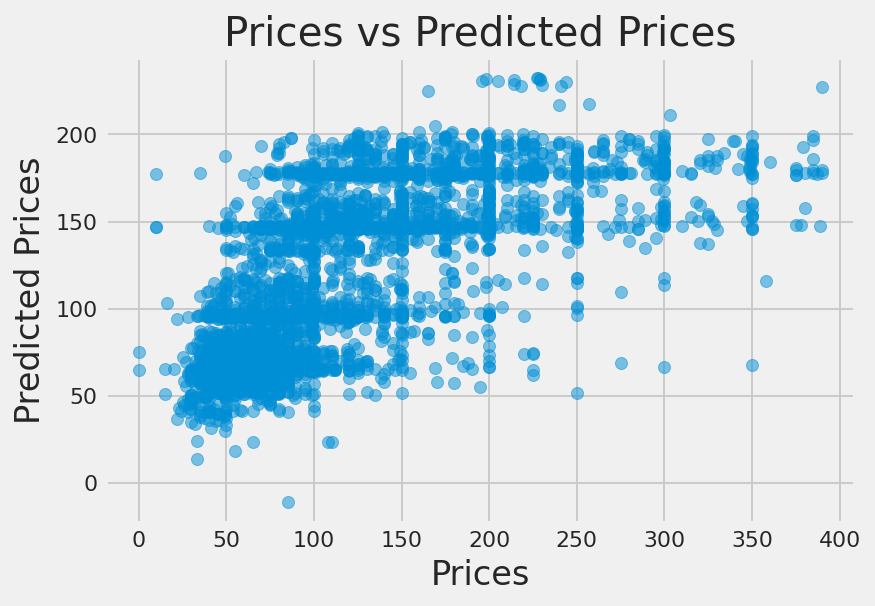

In [10]:
import sklearn.linear_model as lm

linear_model = lm.LinearRegression()

# Fit your linear model
#linear_model.fit(...)
linear_model.fit(X_train,Y_train)

# Predict housing prices on the test set
Y_pred = linear_model.predict(X_test)

# Plot predicted vs true prices
plt.scatter(Y_test, Y_pred, alpha=0.5)
plt.xlabel("Prices")
plt.ylabel("Predicted Prices")
plt.title("Prices vs Predicted Prices");

In [11]:
def rmse(actual_y, predicted_y):
    """
    Args:
        predicted_y: an array of the prediction from the model
        actual_y: an array of the groudtruth label
        
    Returns:
        The root mean square error between the prediction and the groundtruth
    """

    return np.sqrt(np.mean((actual_y - predicted_y)**2))

train_error = rmse(Y_train,linear_model.predict(X_train))
test_error = rmse(Y_test,linear_model.predict(X_test))

print("Training RMSE:", train_error)
print("Test RMSE:", test_error)

Training RMSE: 53.67492489319242
Test RMSE: 53.20228593426455


Here, we perform regularization using first *n* features to check for overfitting.

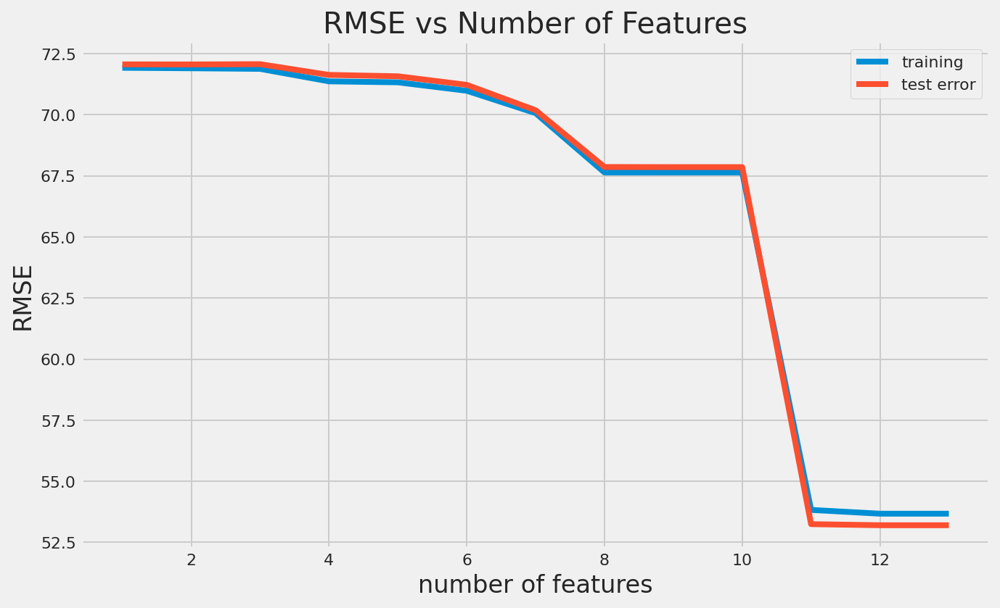

In [12]:
train_error_vs_N = []
test_error_vs_N = []

range_of_num_features = range(1, X_train.shape[1] + 1)

for N in range_of_num_features:
    X_train_first_N_features = X_train.iloc[:, :N]    
    
    linear_model.fit(X_train_first_N_features, Y_train)
    train_error_overfit = rmse(Y_train, linear_model.predict(X_train_first_N_features))
    train_error_vs_N.append(train_error_overfit)
    
    X_test_first_N_features = X_test.iloc[:, :N]
    test_error_overfit = rmse(Y_test, linear_model.predict(X_test_first_N_features))    
    test_error_vs_N.append(test_error_overfit)
    
plt.figure(figsize=(10, 6))
plt.plot(range_of_num_features, train_error_vs_N)
plt.plot(range_of_num_features, test_error_vs_N)
plt.legend(["training", "test error"])
plt.title('RMSE vs Number of Features')
plt.xlabel("number of features")
plt.ylabel("RMSE");

We notice that the test error is lower than the training error. This is strange. We were first wondering if we did something fundamentally wrong, but it is possible that it is like this by chance. To determine if this happens at all times, we decided to run for-loops on multiple values of `random_state` for the train-test split and calculate a rough probability that the test error will be above or below the training error.

In [13]:
def test_seed(seed):
    X_train, X_test = train_test_split(X, test_size = 0.1, random_state = seed)
    Y_train, Y_test = train_test_split(Y, test_size = 0.1, random_state = seed)
    train_error_vs_N = []
    test_error_vs_N = []
    
    range_of_num_features = range(1, X_train.shape[1] + 1)
    
    for N in range_of_num_features:
        X_train_first_N_features = X_train.iloc[:, :N]    
        
        linear_model.fit(X_train_first_N_features, Y_train)
        train_error_overfit = rmse(Y_train, linear_model.predict(X_train_first_N_features))
        train_error_vs_N.append(train_error_overfit)
        
        X_test_first_N_features = X_test.iloc[:, :N]
        test_error_overfit = rmse(Y_test, linear_model.predict(X_test_first_N_features))    
        test_error_vs_N.append(test_error_overfit)
        
    return (train_error_vs_N[-1] - test_error_vs_N[-1])

In [14]:
seedresults = []

for i in np.arange(100):
    seedresults.append(test_seed(i))

In [15]:
seedresults

[0.0014966138834111575,
 0.15771764442605019,
 -1.4315326755527948,
 1.098925654337279,
 0.95783710061135,
 2.0079983610782293,
 -0.251163313298818,
 0.5398261305045651,
 0.6509995342514614,
 -0.30625865283154496,
 0.7030509503179658,
 -1.7089773491536846,
 0.05063257483090666,
 0.754462006137544,
 -0.7643969637109436,
 0.7465358504057207,
 1.126313174502549,
 -0.022107724413331198,
 -0.6228643721393112,
 0.12181750802432845,
 2.248231090289117,
 -3.112574250078282,
 1.400285388698478,
 -0.41573244364889916,
 -0.7133525267814136,
 0.02670650226561122,
 -1.7636033250088445,
 -0.43528770340645195,
 -0.21785887999713083,
 -0.11506562031540568,
 1.6203029384747865,
 -2.049482667803119,
 -2.017432013914764,
 -0.9898841783635817,
 -2.197905074642314,
 -0.2892265459157599,
 -0.630821309840023,
 1.362395616607067,
 -0.37860051857629884,
 -0.8841430792170897,
 1.6695436402441217,
 -0.7487049222635989,
 1.1830652945041464,
 0.2875745651243591,
 0.4196737945536171,
 -0.9116605794302757,
 0.724831

We realise now that the difference between training error and test error depends on the training/test split, which indicates high variance in our data set that may affect the sampling.

In [0]:
np.count_nonzero(np.array(seedresults) > 0)

The training error is above the test error almost half the time (42 out of 100 times.) Below, we calculate the largest and smallest difference:

In [0]:
np.max(np.array(seedresults)) # 20
np.min(np.array(seedresults)) # 21

(Just to make sure the rest of the project is not affected, we will reset `X_train`, `X_test`, `Y_train`, and `Y_test` to the initial `random_state` value we used above.)

In [0]:
X_train, X_test = train_test_split(X, test_size = 0.1, random_state = 83)
Y_train, Y_test = train_test_split(Y, test_size = 0.1, random_state = 83)

However, in either case, the RMSE for the test and training data sets never diverge, and both decrease as the number of features increases, suggesting that there is no overfitting in our model.

In [0]:
model.fit(encoded_data.drop(["price"],axis=1), encoded_data[["price"]])

In [0]:
encoded_data['pricehat_sklearn'] = model.predict(encoded_data.drop(["price"],axis=1))
encoded_data

In [0]:
corr = encoded_data.corr()
plt.figure(figsize=(18,12))
sns.heatmap(corr, annot=True)

**Cross Validation**

There is still a risk of overfitting on the test set because the parameters can be tweaked until the estimator performs optimally. This way, knowledge about the test set can “leak” into the model and evaluation metrics no longer report on generalization performance. To solve this problem, yet another part of the dataset can be held out as a so-called “validation set”: training proceeds on the training set, after which evaluation is done on the validation set, and when the experiment seems to be successful, final evaluation can be done on the test set.

In [0]:
from sklearn.model_selection import KFold

def compute_CV_error(model, X_train, Y_train):
    kf = KFold(n_splits=5)
    validation_errors = []
    
    for train_idx, valid_idx in kf.split(X_train):
        # Split the data into validation sets
        split_X_train, split_X_valid = X_train.iloc[train_idx], X_train.iloc[valid_idx]
        split_Y_train, split_Y_valid = Y_train.iloc[train_idx], Y_train.iloc[valid_idx]

        # Fit the model on the training split
        model.fit(split_X_train, split_Y_train)
        
        # Compute the RMSE on the validation split
        error = rmse(model.predict(split_X_valid), split_Y_valid)

        validation_errors.append(error)
        
    return np.mean(validation_errors)

compute_CV_error(lm.LinearRegression(),X_train,Y_train)

In [0]:
errors = []
for N in range_of_num_features:
    print(f"Trying first {N} features")
    model = lm.LinearRegression()
    
    # compute the cross validation error
    error = compute_CV_error(model, X_train.iloc[:, :N],Y_train)
    
    print("\tRMSE:", error)
    errors.append(error)

best_num_features = np.argmin(errors) + 1
best_err = np.min(errors)

print(f"Best choice, use the first {best_num_features} features")

In [0]:
# Fit your linear model
model = lm.LinearRegression()
model.fit(X_train.iloc[:, :best_num_features], Y_train)

# Predict points from our test set and calculate the rmse
train_rmse = rmse(Y_train, model.predict(X_train.iloc[:, :best_num_features])) 
test_rmse = rmse(Y_test, model.predict(X_test.iloc[:, :best_num_features]))

print("Train RMSE", train_rmse)
print("KFold Validation RMSE", best_err)
print("Test RMSE", test_rmse)

In [0]:
plt.figure(figsize=(10, 6))
fitted_values = model.predict(X_test.iloc[:, :best_num_features])
plt.scatter(fitted_values, Y_test - fitted_values)
plt.xlabel('Fitted Values')
plt.ylabel('residual (true y - estimated y)')
plt.title("Residual of prediction for i'th Airbnb")
plt.axhline(y = 0, color='r');

The residual plot, while not the worst, exhibits heteroskedasticity. This may point to limitations with linear regression.

##### Bonus on investigating heteroskedasticity, patterns with `neighbourhood_group` and `room_type`, and why model should include both features

We wanted to run a regression for each of the `neighbourhood_group`s, partly to see if we could predict prices better if the regression ran only on a single borough's data and partly if we could see any explanation for the patterns we see in the residual plot above. We realised that each of the regression models yielded very *noticeable clusters* of points. We did confirmatory colour-coding and realised that these clusters correspond to the `room_type` value of each point.

**Model for each `neighbourhood_group`**

In [0]:
# Bronx
encoded_data_Bronx = encoded_data[encoded_data["Bronx"] == 1].drop(["Bronx", "Brooklyn", "Manhattan", "Queens", "Staten Island"],axis=1)
X_Bronx = encoded_data_Bronx.drop(["price"],axis=1)
Y_Bronx = pd.Series(encoded_data_Bronx['price'])

X_Bronx_train, X_Bronx_test = train_test_split(X_Bronx, test_size = 0.1, random_state = 83)
Y_Bronx_train, Y_Bronx_test = train_test_split(Y_Bronx, test_size = 0.1, random_state = 83)

linear_model = lm.LinearRegression()

# Fit your linear model
#linear_model.fit(...)
linear_model.fit(X_Bronx_train,Y_Bronx_train)

# Predict housing prices on the test set
Y_Bronx_pred = linear_model.predict(X_Bronx_test)

# Plot predicted vs true prices
Compare_Bronx = pd.DataFrame()
Compare_Bronx['y'] = Y_Bronx_test
Compare_Bronx['predicted y'] = Y_Bronx_pred
Compare_Bronx['room_type'] = data.iloc[Y_Bronx_test.index.values.tolist(),:]['room_type']
sns.scatterplot(data=Compare_Bronx, x='y', y='predicted y', hue='room_type')
plt.title("Prices vs Predicted Prices (Bronx)");

In [0]:
# Brooklyn
encoded_data_Brooklyn = encoded_data[encoded_data["Brooklyn"] == 1].drop(["Bronx", "Brooklyn", "Manhattan", "Queens", "Staten Island"],axis=1)
X_Brooklyn = encoded_data_Brooklyn.drop(["price"],axis=1)
Y_Brooklyn = pd.Series(encoded_data_Brooklyn['price'])

X_Brooklyn_train, X_Brooklyn_test = train_test_split(X_Brooklyn, test_size = 0.1, random_state = 83)
Y_Brooklyn_train, Y_Brooklyn_test = train_test_split(Y_Brooklyn, test_size = 0.1, random_state = 83)

linear_model = lm.LinearRegression()

# Fit your linear model
#linear_model.fit(...)
linear_model.fit(X_Brooklyn_train,Y_Brooklyn_train)

# Predict housing prices on the test set
Y_Brooklyn_pred = linear_model.predict(X_Brooklyn_test)

# Plot predicted vs true prices
Compare_Brooklyn = pd.DataFrame()
Compare_Brooklyn['y'] = Y_Brooklyn_test
Compare_Brooklyn['predicted y'] = Y_Brooklyn_pred
Compare_Brooklyn['room_type'] = data.iloc[Y_Brooklyn_test.index.values.tolist(),:]['room_type']
sns.scatterplot(data=Compare_Brooklyn, x='y', y='predicted y', hue='room_type')
plt.title("Prices vs Predicted Prices (Brooklyn)");

In [0]:
# Manhattan
encoded_data_Manhattan = encoded_data[encoded_data["Manhattan"] == 1].drop(["Bronx", "Brooklyn", "Manhattan", "Queens", "Staten Island"],axis=1)
X_Manhattan = encoded_data_Manhattan.drop(["price"],axis=1)
Y_Manhattan = pd.Series(encoded_data_Manhattan['price'])

X_Manhattan_train, X_Manhattan_test = train_test_split(X_Manhattan, test_size = 0.1, random_state = 83)
Y_Manhattan_train, Y_Manhattan_test = train_test_split(Y_Manhattan, test_size = 0.1, random_state = 83)

linear_model = lm.LinearRegression()

# Fit your linear model
#linear_model.fit(...)
linear_model.fit(X_Manhattan_train,Y_Manhattan_train)

# Predict housing prices on the test set
Y_Manhattan_pred = linear_model.predict(X_Manhattan_test)

# Plot predicted vs true prices
Compare_Manhattan = pd.DataFrame()
Compare_Manhattan['y'] = Y_Manhattan_test
Compare_Manhattan['predicted y'] = Y_Manhattan_pred
Compare_Manhattan['room_type'] = data.iloc[Y_Manhattan_test.index.values.tolist(),:]['room_type']
sns.scatterplot(data=Compare_Manhattan, x='y', y='predicted y', hue='room_type')
plt.title("Prices vs Predicted Prices (Manhattan)");

In [0]:
# Queens
encoded_data_Queens = encoded_data[encoded_data["Queens"] == 1].drop(["Bronx", "Brooklyn", "Manhattan", "Queens", "Staten Island"],axis=1)
X_Queens = encoded_data_Queens.drop(["price"],axis=1)
Y_Queens = pd.Series(encoded_data_Queens['price'])

X_Queens_train, X_Queens_test = train_test_split(X_Queens, test_size = 0.1, random_state = 83)
Y_Queens_train, Y_Queens_test = train_test_split(Y_Queens, test_size = 0.1, random_state = 83)

linear_model = lm.LinearRegression()

# Fit your linear model
#linear_model.fit(...)
linear_model.fit(X_Queens_train,Y_Queens_train)

# Predict housing prices on the test set
Y_Queens_pred = linear_model.predict(X_Queens_test)

# Plot predicted vs true prices
Compare_Queens = pd.DataFrame()
Compare_Queens['y'] = Y_Queens_test
Compare_Queens['predicted y'] = Y_Queens_pred
Compare_Queens['room_type'] = data.iloc[Y_Queens_test.index.values.tolist(),:]['room_type']
sns.scatterplot(data=Compare_Queens, x='y', y='predicted y', hue='room_type')
plt.title("Prices vs Predicted Prices (Queens)");

In [0]:
# StatenIsland
encoded_data_Staten_Island = encoded_data[encoded_data["Staten Island"] == 1].drop(["Bronx", "Brooklyn", "Manhattan", "Queens", "Staten Island"],axis=1)
X_Staten_Island = encoded_data_Staten_Island.drop(["price"],axis=1)
Y_Staten_Island = pd.Series(encoded_data_Staten_Island['price'])

X_Staten_Island_train, X_Staten_Island_test = train_test_split(X_Staten_Island, test_size = 0.1, random_state = 83)
Y_Staten_Island_train, Y_Staten_Island_test = train_test_split(Y_Staten_Island, test_size = 0.1, random_state = 83)

linear_model = lm.LinearRegression()

# Fit your linear model
#linear_model.fit(...)
linear_model.fit(X_Staten_Island_train,Y_Staten_Island_train)

# Predict housing prices on the test set
Y_Staten_Island_pred = linear_model.predict(X_Staten_Island_test)

# Plot predicted vs true prices
Compare_Staten_Island = pd.DataFrame()
Compare_Staten_Island['y'] = Y_Staten_Island_test
Compare_Staten_Island['predicted y'] = Y_Staten_Island_pred
Compare_Staten_Island['room_type'] = data.iloc[Y_Staten_Island_test.index.values.tolist(),:]['room_type']
sns.scatterplot(data=Compare_Staten_Island, x='y', y='predicted y', hue='room_type')
plt.title("Prices vs Predicted Prices (Staten Island)");

Wanting to see if a series of models divided by `room_type` would make more sense, we then made models for each unique value of `room type.`

**Model for each `room_type`**

In [0]:
# Entire home/apt
encoded_data_Entire = encoded_data[encoded_data["Entire home/apt"] == 1].drop(["Entire home/apt", "Private room", "Shared room"],axis=1)
X_Entire = encoded_data_Entire.drop(["price"],axis=1)
Y_Entire = pd.Series(encoded_data_Entire['price'])

X_Entire_train, X_Entire_test = train_test_split(X_Entire, test_size = 0.1, random_state = 83)
Y_Entire_train, Y_Entire_test = train_test_split(Y_Entire, test_size = 0.1, random_state = 83)

linear_model = lm.LinearRegression()

# Fit your linear model
#linear_model.fit(...)
linear_model.fit(X_Entire_train,Y_Entire_train)

# Predict housing prices on the test set
Y_Entire_pred = linear_model.predict(X_Entire_test)

# Plot predicted vs true prices
plt.scatter(Y_Entire_test, Y_Entire_pred, alpha=0.5)
plt.xlabel("Prices")
plt.ylabel("Predicted Prices")
plt.title("Prices vs Predicted Prices (Entire home/apt)");

# Plot predicted vs true prices
Compare_Entire = pd.DataFrame()
Compare_Entire['y'] = Y_Entire_test
Compare_Entire['predicted y'] = Y_Entire_pred
Compare_Entire['neighbourhood_group'] = data.iloc[Y_Entire_test.index.values.tolist(),:]['neighbourhood_group']
sns.scatterplot(data=Compare_Entire, x='y', y='predicted y', hue='neighbourhood_group')
plt.title("Prices vs Predicted Prices (Entire house/apt)");

In [0]:
# Private room
encoded_data_Private = encoded_data[encoded_data["Private room"] == 1].drop(["Private room", "Private room", "Shared room"],axis=1)
X_Private = encoded_data_Private.drop(["price"],axis=1)
Y_Private = pd.Series(encoded_data_Private['price'])

X_Private_train, X_Private_test = train_test_split(X_Private, test_size = 0.1, random_state = 83)
Y_Private_train, Y_Private_test = train_test_split(Y_Private, test_size = 0.1, random_state = 83)

linear_model = lm.LinearRegression()

# Fit your linear model
#linear_model.fit(...)
linear_model.fit(X_Private_train,Y_Private_train)

# Predict housing prices on the test set
Y_Private_pred = linear_model.predict(X_Private_test)

# Plot predicted vs true prices
Compare_Private = pd.DataFrame()
Compare_Private['y'] = Y_Private_test
Compare_Private['predicted y'] = Y_Private_pred
Compare_Private['neighbourhood_group'] = data.iloc[Y_Private_test.index.values.tolist(),:]['neighbourhood_group']
sns.scatterplot(data=Compare_Private, x='y', y='predicted y', hue='neighbourhood_group')
plt.title("Prices vs Predicted Prices (Private room)");

In [0]:
# Shared room
encoded_data_Shared = encoded_data[encoded_data["Shared room"] == 1].drop(["Private room", "Private room", "Shared room"],axis=1)
X_Shared = encoded_data_Shared.drop(["price"],axis=1)
Y_Shared = pd.Series(encoded_data_Shared['price'])

X_Shared_train, X_Shared_test = train_test_split(X_Shared, test_size = 0.1, random_state = 83)
Y_Shared_train, Y_Shared_test = train_test_split(Y_Shared, test_size = 0.1, random_state = 83)

linear_model = lm.LinearRegression()

# Fit your linear model
#linear_model.fit(...)
linear_model.fit(X_Shared_train,Y_Shared_train)

# Predict housing prices on the test set
Y_Shared_pred = linear_model.predict(X_Shared_test)

# Plot predicted vs true prices
Compare_Shared = pd.DataFrame()
Compare_Shared['y'] = Y_Shared_test
Compare_Shared['predicted y'] = Y_Shared_pred
Compare_Shared['neighbourhood_group'] = data.iloc[Y_Shared_test.index.values.tolist(),:]['neighbourhood_group']
sns.scatterplot(data=Compare_Shared, x='y', y='predicted y', hue='neighbourhood_group')
plt.title("Prices vs Predicted Prices (Shared room)");

We can see that the models also lead to noticeable clusters divided by `neighbourhood_group`, although with more overlap between the clusters. This shows that **both variables have a noticeable impact on price** and both features should be present in a model attempting to predict price of AirBNB listings across New York City. These features, even if they are potentially the source of the weird patterns in our model's residual plot, are probably why our model has (some) predictive power. Refer to our correlation matrix: the alternative is to make modesl for each room type in each borough but because the only remaining factors (most of which are numerical, like `number_of_reviews`) have poor correlation power, all of those models will probably be ineffective.

One interesting thing to attempt is to create a multiclass classification model that would calculate the probability of a listing being in a particular `neighbourhood_group` or `room_type` given a price. If done, we could perhaps advise people on what sorts of amenities and locations they can expect to afford at a given price range, given data on all Airbnb listings. That, however, is a project for another day...

## Conclusion

We can predict the price using information in the data set to some extent. As seen above, the correlation between the actual and predicted price is 0.67. Moreover, the rmse for both the training and test data set decreases as the number of features increases, indicating that there is no overfitting in our model. Nonetheless, we also recognize that no single feature in the data set is very strongly correlated with the actual price, which limits our ability to predict the price to a very high degree of accuracy.

Moreover, our model is limited by the fact that the price column in the data set is skewed. As a result, we can only come up with a reasonably accurate model for values within 1 standard deviation from the mean. As seen from the EDA, around 87% of values in the price column is below 250. As such, the model works reasonably well by consistently predicting values below that.